In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import yaml

In [2]:
def load_metrics(base_path):
    """Load test performance metrics from all timestamp directories."""
    data = []

    for dir_name in sorted(os.listdir(base_path), key=lambda x: int(x.split("_")[-1])):  # Sort by index
        dir_path = os.path.join(base_path, dir_name)
        file_path = os.path.join(f"{dir_path}/lightning_logs", "metrics.csv")
        print(file_path)
        if os.path.exists(file_path):
            df = pd.read_csv(file_path)
            # df.columns = ["epoch", "gpu_memory_allocated_MB", "gpu_memory_reserved_MB", "step",
            #               "test_au_roc", "test_avg_pr", "test_loss", "time_sec",
            #               "train_au_roc", "train_avg_pr", "train_loss",
            #               "val_au_roc", "val_avg_pr", "val_loss"]

            # Get last epoch's test metrics
            latest_metrics = df.iloc[-1]
            data.append({
                "timestamp": int(dir_name.split("_")[-1]),
                "test_au_roc": float(latest_metrics["test_au_roc"]),
                "test_avg_pr": float(latest_metrics["test_avg_pr"]),
                "test_loss": float(latest_metrics["test_loss"]),
                "test_aucnpr": float(latest_metrics["test_aucnpr"]),
                "gpu_memory_allocated_MB": float(latest_metrics["gpu_memory_allocated_MB"]),
                "gpu_memory_reserved_MB": float(latest_metrics["gpu_memory_reserved_MB"])
            })
    return pd.DataFrame(data).sort_values("timestamp")


In [3]:
def avg_metric(df_metrics):
    num_sample = len(df_metrics)
    avg_aucpr = df_metrics['test_avg_pr'].mean()
    avg_aucnpr = df_metrics['test_aucnpr'].mean()
    avg_au_roc = df_metrics['test_au_roc'].mean()
    avg_allocated_MB = df_metrics['gpu_memory_allocated_MB'].mean()
    gpu_memory_reserved_MB = df_metrics['gpu_memory_reserved_MB'].mean()
    return {
        'snapshots': num_sample,
        'avg_aucpr': avg_aucpr,
        'avg_au_roc': avg_au_roc,
        'avg_aucnpr': avg_aucnpr,
        'avg_allocated_MB': avg_allocated_MB,
        'gpu_memory_reserved_MB': gpu_memory_reserved_MB
    }

In [4]:
def load_epoch_metrics(base_path):
    """Load all training and validation metrics for each index directory over epochs."""
    metrics = []

    for dir_name in sorted(os.listdir(base_path), key=lambda x: int(x.split("_")[-1])):  # Sort directories by index
        dir_path = os.path.join(base_path, dir_name)
        file_path = os.path.join(f"{dir_path}/lightning_logs", "metrics.csv")

        if os.path.exists(file_path):
            df = pd.read_csv(file_path, header=None).iloc[1:].reset_index(drop=True)
            df.columns = ["epoch", "gpu_memory_allocated_MB", "gpu_memory_reserved_MB", "step",
                          "test_au_roc", "test_avg_pr","test_aucnpr" "test_loss", "time_sec",
                          "train_au_roc", "train_avg_pr", "train_aucnpr", "train_loss",
                          "val_au_roc", "val_avg_pr", "val_aucnpr", "val_loss"]
            df = df[["epoch", "train_loss", "val_loss", "train_au_roc", "val_au_roc"]]
            train_df = df[["epoch", "train_loss", "train_au_roc"]].dropna()
            val_df = df[["epoch", "val_loss", "val_au_roc"]].dropna()
            merged_df = pd.merge(val_df, train_df, on="epoch", how='inner')
            merged_df["index"] = int(dir_name.split("_")[-1])  # Add index number
            merged_df['epoch'] = merged_df['epoch'].astype(int)
            merged_df[['train_loss', 'val_loss', 'train_au_roc', 'val_au_roc']] = merged_df[['train_loss', 'val_loss', 'train_au_roc', 'val_au_roc']].astype(float)
            metrics.append(merged_df[["index", "epoch", "train_loss", "val_loss", "train_au_roc", "val_au_roc"]])

    return pd.concat(metrics)

In [5]:
def result_preview(result_paths, visualization=False):

    # result_dict = {name.replace("_path",""):load_metrics(path).sort_values("timestamp") for name,path in result_paths.items()}
    result_dict = {load_hparams(path):load_metrics(path).sort_values("timestamp") for path in result_paths}
    if visualization:
        for metric in ["test_au_roc", "test_avg_pr","test_aucnpr", "test_loss"]:
            plt.figure(figsize=(40, 15))
            for result_name, result_df in result_dict.items():
                plt.plot(result_df["timestamp"], result_df[metric],
                 label=result_name)
            plt.xlabel("Timestamp")
            plt.ylabel(metric)
            plt.title(f"Comparison of {metric} over time")
            plt.legend()
            plt.grid()
            plt.show()
    rows = []
    for result_name, result_df in result_dict.items():
        row = avg_metric(result_df)
        row['name'] = result_name
        rows.append(row)

    summary_df = pd.DataFrame(rows)
    summary_df = summary_df.set_index('name')
    return summary_df



In [6]:
def find_dirs_with_exact_indices(base_path):
    expected_dirs = {f"index_{i}" for i in range(149)}  # from index_0 to index_150
    matching_dirs = []

    for current_dir, subdirs, files in os.walk(base_path):
        subdirs_set = set(subdirs)
        if subdirs_set == expected_dirs:
            matching_dirs.append(current_dir)

    return matching_dirs

In [7]:
def load_hparams(dir_path):
    hparam_path = os.path.join(dir_path,"index_0/lightning_logs/hparams.yaml")
    print(hparam_path)
    if os.path.isfile(hparam_path):
        with open(hparam_path,'r') as f:
            return f"{yaml.safe_load(f)}"
    else:
        return None

In [11]:
roland_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/roland/edge_level/RedditTitle/week/GIN_gru_128_128/2025-05-20_22:53:23"
base_directory = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week"
matching_parents = find_dirs_with_exact_indices(base_directory)
matching_parents.append(roland_path)
for path in sorted(matching_parents):
    print(path)
    print(load_hparams(path))

/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GIN_FFalse/2025-05-14_22:46:48
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GIN_FFalse/2025-05-14_22:46:48/index_0/lightning_logs/hparams.yaml
{'enable_memory': False, 'fresh_start': False, 'epochs': 200, 'learning_rate': 0.005, 'alpha': 0.0, 'anomaly_loss_margin': 4.0, 'blend_factor': 0.9, 'hidden_size': 128, 'memory_size': 256, 'gnn_type': 'GIN', 'num_layers': 2, 'dropout': 0.0, 'dataset_name': 'RedditTitle', 'force_reload_dataset': False, 'graph_window_size': 'week', 'num_windows': 150, 'embedding_visualization': False}
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GIN_FFalse/2025-05-15_05:34:37
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GIN_FFalse/2025-05-15_05:34:37/index_0/lightning_logs/hparams

In [12]:
x = result_preview(matching_parents)

/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemTrue_GIN_FFalse/2025-05-19_10:32:19/index_0/lightning_logs/hparams.yaml
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemTrue_GIN_FFalse/2025-05-19_10:32:19/index_0/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemTrue_GIN_FFalse/2025-05-19_10:32:19/index_1/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemTrue_GIN_FFalse/2025-05-19_10:32:19/index_2/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemTrue_GIN_FFalse/2025-05-19_10:32:19/index_3/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemTrue_GIN_FFalse/2025-05-19_10:32:19/index_4/

In [13]:
x

,snapshots,avg_aucpr,avg_au_roc,avg_aucnpr,avg_allocated_MB,gpu_memory_reserved_MB
name,,,,,,
"{'enable_memory': True, 'fresh_start': False, 'epochs': 200, 'learning_rate': 0.01, 'alpha': 0.1, 'anomaly_loss_margin': 4.0, 'blend_factor': 1.0, 'hidden_size': 128, 'memory_size': 256, 'gnn_type': 'GIN', 'num_layers': 2, 'dropout': 0.0, 'dataset_name': 'RedditTitle', 'force_reload_dataset': False, 'graph_window_size': 'week', 'num_windows': 150, 'embedding_visualization': False}",149,0.451610,0.852130,0.419322,152.136033,255.711800
"{'enable_memory': True, 'fresh_start': False, 'epochs': 200, 'learning_rate': 0.01, 'alpha': 0.05, 'anomaly_loss_margin': 4.0, 'blend_factor': 0.9, 'hidden_size': 128, 'memory_size': 256, 'gnn_type': 'GIN', 'num_layers': 2, 'dropout': 0.0, 'dataset_name': 'RedditTitle', 'force_reload_dataset': False, 'graph_window_size': 'week', 'num_windows': 150, 'embedding_visualization': False}",149,0.450755,0.844475,0.418441,152.136033,255.711800
"{'enable_memory': True, 'fresh_start': False, 'epochs': 200, 'learning_rate': 0.01, 'alpha': 0.05, 'anomaly_loss_margin': 4.0, 'blend_factor': 1.0, 'hidden_size': 128, 'memory_size': 256, 'gnn_type': 'GIN', 'num_layers': 2, 'dropout': 0.0, 'dataset_name': 'RedditTitle', 'force_reload_dataset': False, 'graph_window_size': 'week', 'num_windows': 150, 'embedding_visualization': False}",149,0.451596,0.843154,0.419325,152.136033,255.711800
"{'enable_memory': True, 'fresh_start': False, 'epochs': 200, 'learning_rate': 0.01, 'alpha': 0.1, 'anomaly_loss_margin': 4.0, 'blend_factor': 1.0, 'hidden_size': 128, 'memory_size': 256, 'gnn_type': 'GIN', 'num_layers': 2, 'dropout': 0.3, 'dataset_name': 'RedditTitle', 'force_reload_dataset': False, 'graph_window_size': 'week', 'num_windows': 150, 'embedding_visualization': False}",149,0.512775,0.881969,0.484082,152.136034,255.711800
"{'enable_memory': True, 'fresh_start': False, 'epochs': 200, 'learning_rate': 0.005, 'alpha': 0.05, 'anomaly_loss_margin': 4.0, 'blend_factor': 1.0, 'hidden_size': 128, 'memory_size': 256, 'gnn_type': 'GIN', 'num_layers': 2, 'dropout': 0.0, 'dataset_name': 'RedditTitle', 'force_reload_dataset': False, 'graph_window_size': 'week', 'num_windows': 150, 'embedding_visualization': False}",149,0.436077,0.832895,0.402910,152.136033,255.711800
...,...,...,...,...,...,...
"{'enable_memory': False, 'fresh_start': True, 'epochs': 200, 'learning_rate': 0.005, 'alpha': 0.1, 'anomaly_loss_margin': 4.0, 'blend_factor': 0.9, 'hidden_size': 128, 'memory_size': 256, 'gnn_type': 'GIN', 'num_layers': 2, 'dropout': 0.0, 'dataset_name': 'RedditTitle', 'force_reload_dataset': False, 'graph_window_size': 'week', 'num_windows': 150, 'embedding_visualization': False}",149,0.312690,0.736571,0.272232,113.931336,217.414138
"{'enable_memory': False, 'fresh_start': True, 'epochs': 200, 'learning_rate': 0.01, 'alpha': 0.05, 'anomaly_loss_margin': 4.0, 'blend_factor': 1.0, 'hidden_size': 128, 'memory_size': 256, 'gnn_type': 'GIN', 'num_layers': 2, 'dropout': 0.3, 'dataset_name': 'RedditTitle', 'force_reload_dataset': False, 'graph_window_size': 'week', 'num_windows': 150, 'embedding_visualization': False}",149,0.454602,0.842800,0.422495,113.931336,217.414138
"{'enable_memory': False, 'fresh_start': True, 'epochs': 200, 'learning_rate': 0.01, 'alpha': 0.05, 'anomaly_loss_margin': 4.0, 'blend_factor': 0.9, 'hidden_size': 128, 'memory_size': 256, 'gnn_type': 'GIN', 'num_layers': 2, 'dropout': 0.3, 'dataset_name': 'RedditTitle', 'force_reload_dataset': False, 'graph_window_size': 'week', 'num_windows': 150, 'embedding_visualization': False}",149,0.459802,0.845699,0.427984,113.931336,217.414138


# RedditTitle

## GCN

/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GCN_FFalse/2025-04-22_03:37:34/index_0/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GCN_FFalse/2025-04-22_03:37:34/index_1/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GCN_FFalse/2025-04-22_03:37:34/index_2/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GCN_FFalse/2025-04-22_03:37:34/index_3/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GCN_FFalse/2025-04-22_03:37:34/index_4/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GCN_FFalse/2025-04-22_03:37:34/ind

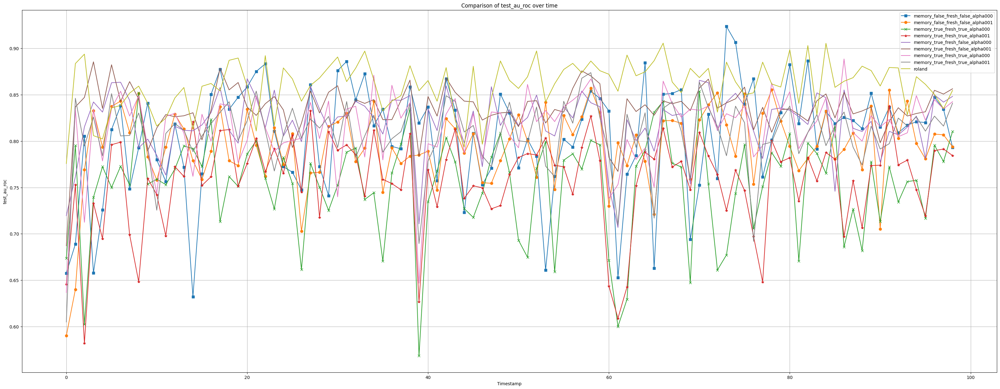

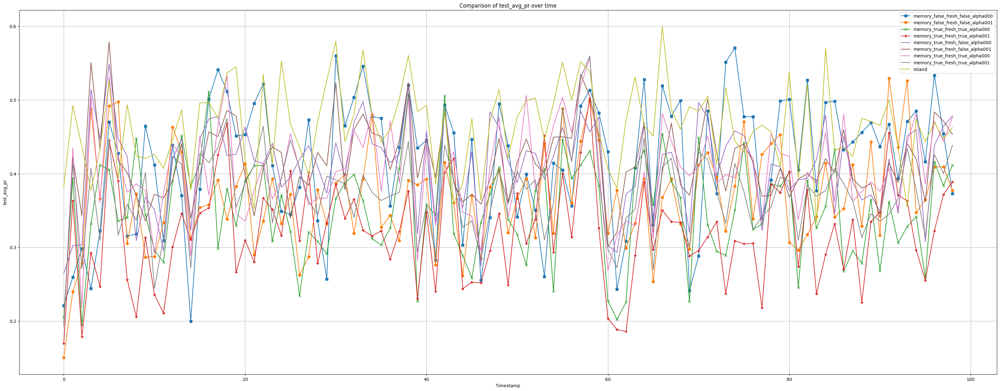

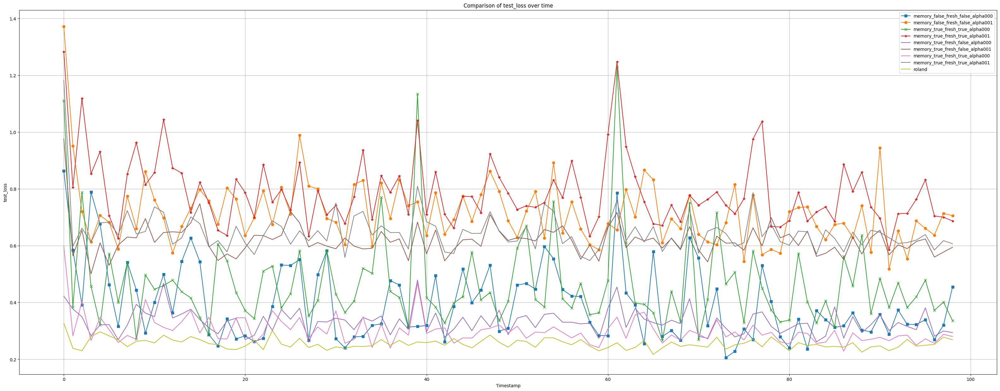

memory_false_fresh_false_alpha000:
snapshots:99, avg_aucpr:0.41703035072846845, avg_au_roc:0.8056241310004032
avg_allocated_MB:113.02046249852036, gpu_memory_reserved_MB:292.4997493859493
--------------------
memory_false_fresh_false_alpha001:
snapshots:99, avg_aucpr:0.3685298078891003, avg_au_roc:0.7943676493384622
avg_allocated_MB:113.0204472397313, gpu_memory_reserved_MB:292.4997493859493
--------------------
memory_false_fresh_true_alpha000:
snapshots:99, avg_aucpr:0.3496330412048282, avg_au_roc:0.75227222057304
avg_allocated_MB:113.0204312873609, gpu_memory_reserved_MB:292.4997493859493
--------------------
memory_false_fresh_true_alpha001:
snapshots:99, avg_aucpr:0.3202123697658982, avg_au_roc:0.7578962252597616
avg_allocated_MB:113.0204312873609, gpu_memory_reserved_MB:292.4997493859493
--------------------
memory_true_fresh_false_alpha000:
snapshots:99, avg_aucpr:0.41085702572206056, avg_au_roc:0.8198398285441928
avg_allocated_MB:151.22665728944722, gpu_memory_reserved_MB:330.7

In [56]:
memory_false_fresh_false_alph000_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GCN_FFalse/2025-04-22_03:37:34"
memory_false_fresh_false_alph001_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GCN_FFalse/2025-04-22_09:24:33"
memory_false_fresh_true_alph000_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GCN_FTrue/2025-04-22_05:01:08"
memory_false_fresh_true_alph001_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GCN_FTrue/2025-04-22_11:00:23"
memory_true_fresh_false_alph000_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemTrue_GCN_FFalse/2025-04-22_04:17:48"
memory_true_fresh_false_alph001_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemTrue_GCN_FFalse/2025-04-22_10:10:58"
memory_true_fresh_true_alph000_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemTrue_GCN_FTrue/2025-04-22_05:41:29"
memory_true_fresh_true_alph001_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemTrue_GCN_FTrue/2025-04-22_11:43:28"
roland_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/roland/edge_level/RedditTitle/week/GCN_gru_128_128/2025-04-23_20:13:46"
df_model_memory_false_fresh_false_alpha000 = load_metrics(memory_false_fresh_false_alph000_path).sort_values("timestamp")
df_model_memory_false_fresh_false_alpha001 = load_metrics(memory_false_fresh_false_alph001_path).sort_values("timestamp")
df_model_memory_false_fresh_true_alpha000 = load_metrics(memory_false_fresh_true_alph000_path).sort_values("timestamp")
df_model_memory_false_fresh_true_alpha001 = load_metrics(memory_false_fresh_true_alph001_path).sort_values("timestamp")
df_model_memory_true_fresh_false_alpha000 = load_metrics(memory_true_fresh_false_alph000_path).sort_values("timestamp")
df_model_memory_true_fresh_false_alpha001 = load_metrics(memory_true_fresh_false_alph001_path).sort_values("timestamp")
df_model_memory_true_fresh_true_alpha000 = load_metrics(memory_true_fresh_true_alph000_path).sort_values("timestamp")
df_model_memory_true_fresh_true_alpha001 = load_metrics(memory_true_fresh_true_alph001_path).sort_values("timestamp")
df_roland = load_metrics(roland_path).sort_values("timestamp")
# plt.figure(figsize=(22, 5))
for metric in ["test_au_roc", "test_avg_pr", "test_loss"]:
    plt.figure(figsize=(40, 15))
    plt.plot(df_model_memory_false_fresh_false_alpha000["timestamp"], df_model_memory_false_fresh_false_alpha000[metric],
             label="memory_false_fresh_false_alpha000", marker='s')
    plt.plot(df_model_memory_false_fresh_false_alpha001["timestamp"], df_model_memory_false_fresh_false_alpha001[metric],
             label="memory_false_fresh_false_alpha001", marker='o')
    plt.plot(df_model_memory_false_fresh_true_alpha000["timestamp"], df_model_memory_false_fresh_true_alpha000[metric],
             label="memory_true_fresh_true_alpha000", marker='x')
    plt.plot(df_model_memory_false_fresh_true_alpha001["timestamp"], df_model_memory_false_fresh_true_alpha001[metric],
             label="memory_true_fresh_true_alpha001", marker='*')
    plt.plot(df_model_memory_true_fresh_false_alpha000["timestamp"], df_model_memory_true_fresh_false_alpha000[metric],
             label="memory_true_fresh_false_alpha000")
    plt.plot(df_model_memory_true_fresh_false_alpha001["timestamp"], df_model_memory_true_fresh_false_alpha001[metric],
             label="memory_true_fresh_false_alpha001")
    plt.plot(df_model_memory_true_fresh_true_alpha000["timestamp"], df_model_memory_true_fresh_true_alpha000[metric],
             label="memory_true_fresh_true_alpha000")
    plt.plot(df_model_memory_true_fresh_true_alpha001["timestamp"], df_model_memory_true_fresh_true_alpha001[metric],
             label="memory_true_fresh_true_alpha001")
    plt.plot(df_roland["timestamp"], df_roland[metric],
             label="roland")
    plt.xlabel("Timestamp")
    plt.ylabel(metric)
    plt.title(f"Comparison of {metric} over time")
    plt.legend()
    plt.grid()
    plt.show()
print("memory_false_fresh_false_alpha000:")
avg_metric(df_model_memory_false_fresh_false_alpha000)
print("memory_false_fresh_false_alpha001:")
avg_metric(df_model_memory_false_fresh_false_alpha001)
print("memory_false_fresh_true_alpha000:")
avg_metric(df_model_memory_false_fresh_true_alpha000)
print("memory_false_fresh_true_alpha001:")
avg_metric(df_model_memory_false_fresh_true_alpha001)
print("memory_true_fresh_false_alpha000:")
avg_metric(df_model_memory_true_fresh_false_alpha000)
print("memory_true_fresh_false_alpha001:")
avg_metric(df_model_memory_true_fresh_false_alpha001)
print("memory_true_fresh_true_alpha000:")
avg_metric(df_model_memory_true_fresh_true_alpha000)
print("memory_true_fresh_true_alpha001:")
avg_metric(df_model_memory_true_fresh_true_alpha001)
print("Roland:")
avg_metric(df_roland)

## GIN

/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GIN_FFalse/2025-04-22_06:30:14/index_0/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GIN_FFalse/2025-04-22_06:30:14/index_1/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GIN_FFalse/2025-04-22_06:30:14/index_2/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GIN_FFalse/2025-04-22_06:30:14/index_3/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GIN_FFalse/2025-04-22_06:30:14/index_4/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GIN_FFalse/2025-04-22_06:30:14/ind

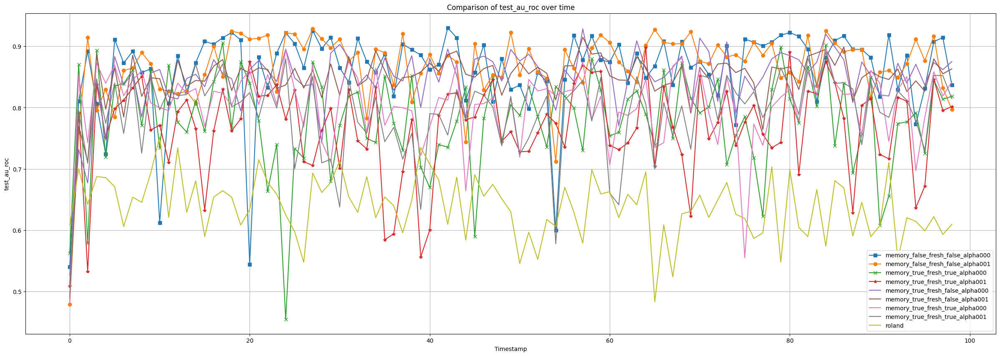

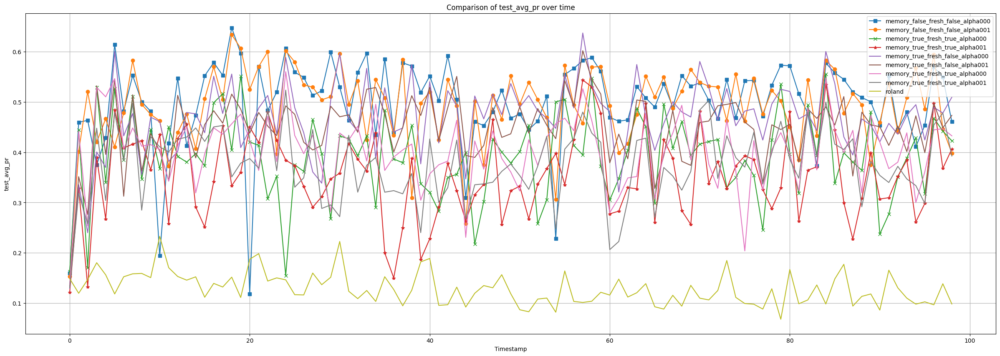

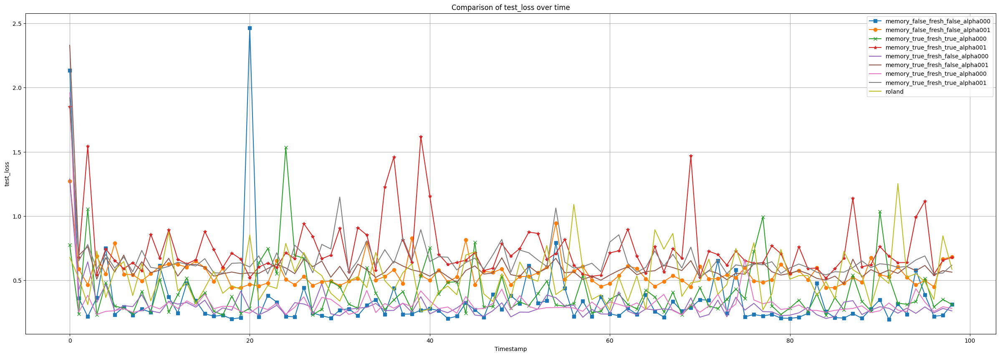

memory_false_fresh_false_alpha000:
snapshots:99, avg_aucpr:0.49860615915421286, avg_au_roc:0.8608953489197625
avg_allocated_MB:113.02146580243351, gpu_memory_reserved_MB:216.30321988192472
--------------------
memory_false_fresh_false_alpha001:
snapshots:99, avg_aucpr:0.49139319811806537, avg_au_roc:0.8671883230257516
avg_allocated_MB:113.02146572536893, gpu_memory_reserved_MB:216.30321988192472
--------------------
memory_false_fresh_true_alpha000:
snapshots:99, avg_aucpr:0.39085609714190167, avg_au_roc:0.7795185817010475
avg_allocated_MB:113.02145609229503, gpu_memory_reserved_MB:216.30321988192472
--------------------
memory_false_fresh_true_alpha001:
snapshots:99, avg_aucpr:0.3526893184341566, avg_au_roc:0.766588330870927
avg_allocated_MB:113.02145609229503, gpu_memory_reserved_MB:216.30321988192472
--------------------
memory_true_fresh_false_alpha000:
snapshots:99, avg_aucpr:0.4680603078820489, avg_au_roc:0.8482518990834554
avg_allocated_MB:151.22768194025213, gpu_memory_reserved

In [60]:
memory_false_fresh_false_alph000_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GIN_FFalse/2025-04-22_06:30:14"
memory_false_fresh_false_alph001_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GIN_FFalse/2025-04-22_12:31:32"
memory_false_fresh_true_alph000_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GIN_FTrue/2025-04-22_07:54:17"
memory_false_fresh_true_alph001_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GIN_FTrue/2025-04-22_13:52:28"
memory_true_fresh_false_alph000_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemTrue_GIN_FFalse/2025-04-22_07:10:08"
memory_true_fresh_false_alph001_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemTrue_GIN_FFalse/2025-04-22_13:10:11"
memory_true_fresh_true_alph000_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemTrue_GIN_FTrue/2025-04-22_08:34:51"
memory_true_fresh_true_alph001_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemTrue_GIN_FTrue/2025-04-22_14:28:22"
roland_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/roland/edge_level/RedditBody/week/GIN_gru_128_128/2025-04-24_06:52:36"
df_model_memory_false_fresh_false_alpha000 = load_metrics(memory_false_fresh_false_alph000_path).sort_values("timestamp")
df_model_memory_false_fresh_false_alpha001 = load_metrics(memory_false_fresh_false_alph001_path).sort_values("timestamp")
df_model_memory_false_fresh_true_alpha000 = load_metrics(memory_false_fresh_true_alph000_path).sort_values("timestamp")
df_model_memory_false_fresh_true_alpha001 = load_metrics(memory_false_fresh_true_alph001_path).sort_values("timestamp")
df_model_memory_true_fresh_false_alpha000 = load_metrics(memory_true_fresh_false_alph000_path).sort_values("timestamp")
df_model_memory_true_fresh_false_alpha001 = load_metrics(memory_true_fresh_false_alph001_path).sort_values("timestamp")
df_model_memory_true_fresh_true_alpha000 = load_metrics(memory_true_fresh_true_alph000_path).sort_values("timestamp")
df_model_memory_true_fresh_true_alpha001 = load_metrics(memory_true_fresh_true_alph001_path).sort_values("timestamp")
df_roland = load_metrics(roland_path).sort_values("timestamp")
# plt.figure(figsize=(22, 5))
for metric in ["test_au_roc", "test_avg_pr", "test_loss"]:
    plt.figure(figsize=(30, 10))
    plt.plot(df_model_memory_false_fresh_false_alpha000["timestamp"], df_model_memory_false_fresh_false_alpha000[metric],
             label="memory_false_fresh_false_alpha000", marker='s')
    plt.plot(df_model_memory_false_fresh_false_alpha001["timestamp"], df_model_memory_false_fresh_false_alpha001[metric],
             label="memory_false_fresh_false_alpha001", marker='o')
    plt.plot(df_model_memory_false_fresh_true_alpha000["timestamp"], df_model_memory_false_fresh_true_alpha000[metric],
             label="memory_true_fresh_true_alpha000", marker='x')
    plt.plot(df_model_memory_false_fresh_true_alpha001["timestamp"], df_model_memory_false_fresh_true_alpha001[metric],
             label="memory_true_fresh_true_alpha001", marker='*')
    plt.plot(df_model_memory_true_fresh_false_alpha000["timestamp"], df_model_memory_true_fresh_false_alpha000[metric],
             label="memory_true_fresh_false_alpha000")
    plt.plot(df_model_memory_true_fresh_false_alpha001["timestamp"], df_model_memory_true_fresh_false_alpha001[metric],
             label="memory_true_fresh_false_alpha001")
    plt.plot(df_model_memory_true_fresh_true_alpha000["timestamp"], df_model_memory_true_fresh_true_alpha000[metric],
             label="memory_true_fresh_true_alpha000")
    plt.plot(df_model_memory_true_fresh_true_alpha001["timestamp"], df_model_memory_true_fresh_true_alpha001[metric],
             label="memory_true_fresh_true_alpha001")
    plt.plot(df_roland["timestamp"], df_roland[metric],
             label="roland")
    plt.xlabel("Timestamp")
    plt.ylabel(metric)
    plt.title(f"Comparison of {metric} over time")
    plt.legend()
    plt.grid()
    plt.show()
print("memory_false_fresh_false_alpha000:")
avg_metric(df_model_memory_false_fresh_false_alpha000)
print("memory_false_fresh_false_alpha001:")
avg_metric(df_model_memory_false_fresh_false_alpha001)
print("memory_false_fresh_true_alpha000:")
avg_metric(df_model_memory_false_fresh_true_alpha000)
print("memory_false_fresh_true_alpha001:")
avg_metric(df_model_memory_false_fresh_true_alpha001)
print("memory_true_fresh_false_alpha000:")
avg_metric(df_model_memory_true_fresh_false_alpha000)
print("memory_true_fresh_false_alpha001:")
avg_metric(df_model_memory_true_fresh_false_alpha001)
print("memory_true_fresh_true_alpha000:")
avg_metric(df_model_memory_true_fresh_true_alpha000)
print("memory_true_fresh_true_alpha001:")
avg_metric(df_model_memory_true_fresh_true_alpha001)
print("Roland:")
avg_metric(df_roland)

## Influence of different alpha and learning rates without mem and fresh_start base model GIN

/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GIN_FFalse/2025-04-26_08:17:19/index_0/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GIN_FFalse/2025-04-26_08:17:19/index_1/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GIN_FFalse/2025-04-26_08:17:19/index_2/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GIN_FFalse/2025-04-26_08:17:19/index_3/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GIN_FFalse/2025-04-26_08:17:19/index_4/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GIN_FFalse/2025-04-26_08:17:19/ind

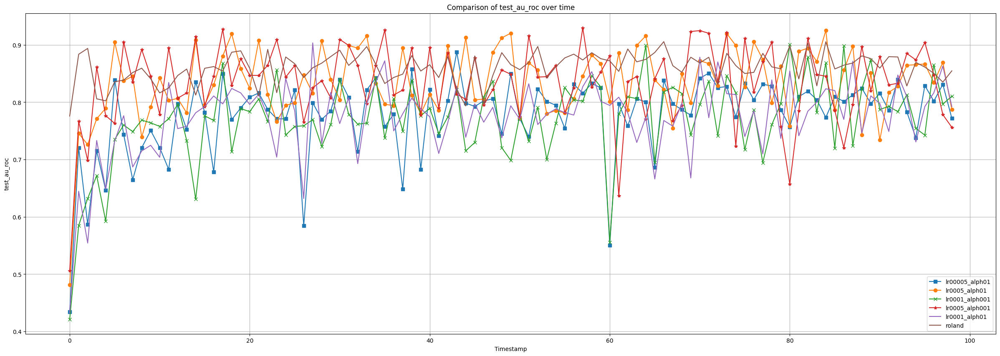

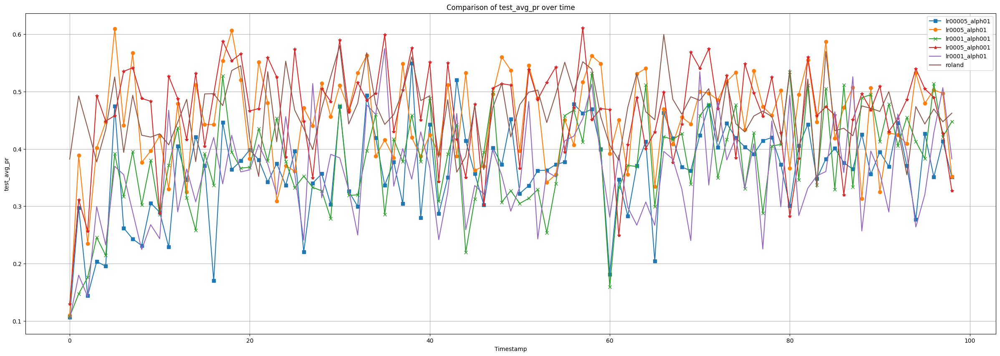

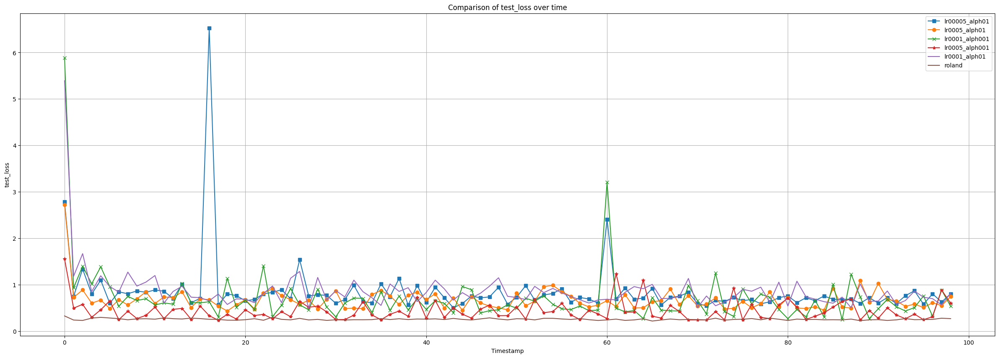

lr00005_alph01:
snapshots:99, avg_aucpr:0.3617742702816472, avg_au_roc:0.7776736427437175
avg_allocated_MB:117.8267672760318, gpu_memory_reserved_MB:223.46319225581004
--------------------
lr0005_alph01:
snapshots:99, avg_aucpr:0.4514095497251761, avg_au_roc:0.8337827285732886
avg_allocated_MB:117.8267672760318, gpu_memory_reserved_MB:223.46319225581004
--------------------
lr0001_alph001:
snapshots:99, avg_aucpr:0.3776997242010001, avg_au_roc:0.7714195067834373
avg_allocated_MB:117.8267672760318, gpu_memory_reserved_MB:223.46319225581004
--------------------
lr0005_alph001:
snapshots:99, avg_aucpr:0.4653092145618766, avg_au_roc:0.8340978893366727
avg_allocated_MB:117.8267672760318, gpu_memory_reserved_MB:223.46319225581004
--------------------
lr0001_alph01:
snapshots:99, avg_aucpr:0.35695016218556297, avg_au_roc:0.7738938175066553
avg_allocated_MB:117.8267672760318, gpu_memory_reserved_MB:223.46319225581004
--------------------
Roland:
snapshots:99, avg_aucpr:0.46449690876585065, avg

In [61]:
lr00005_alph01_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GIN_FFalse/2025-04-26_08:17:19"
lr0005_alph01_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GIN_FFalse/2025-04-26_07:11:32"
lr0001_alph001_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GIN_FFalse/2025-04-26_06:06:48"
lr0005_alph001_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GIN_FFalse/2025-04-26_05:01:41"
lr0001_alph01_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditTitle/week/MemFalse_GIN_FFalse/2025-04-26_03:56:11"

roland_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/roland/edge_level/RedditTitle/week/GCN_gru_128_128/2025-04-23_20:13:46"
df_model_lr00005_alph01 = load_metrics(lr00005_alph01_path).sort_values("timestamp")
df_model_lr0005_alph01 = load_metrics(lr0005_alph01_path).sort_values("timestamp")
df_model_lr0001_alph001 = load_metrics(lr0001_alph001_path).sort_values("timestamp")
df_model_lr0005_alph001 = load_metrics(lr0005_alph001_path).sort_values("timestamp")
df_model_lr0001_alph01 = load_metrics(lr0001_alph01_path).sort_values("timestamp")
df_roland = load_metrics(roland_path).sort_values("timestamp")
# plt.figure(figsize=(22, 5))
for metric in ["test_au_roc", "test_avg_pr", "test_loss"]:
    plt.figure(figsize=(30, 10))
    plt.plot(df_model_lr00005_alph01["timestamp"], df_model_lr00005_alph01[metric],
             label="lr00005_alph01", marker='s')
    plt.plot(df_model_lr0005_alph01["timestamp"], df_model_lr0005_alph01[metric],
             label="lr0005_alph01", marker='o')
    plt.plot(df_model_lr0001_alph001["timestamp"], df_model_lr0001_alph001[metric],
             label="lr0001_alph001", marker='x')
    plt.plot(df_model_lr0005_alph001["timestamp"], df_model_lr0005_alph001[metric],
             label="lr0005_alph001", marker='*')
    plt.plot(df_model_lr0001_alph01["timestamp"], df_model_lr0001_alph01[metric],
             label="lr0001_alph01")
    plt.plot(df_roland["timestamp"], df_roland[metric],
             label="roland")
    plt.xlabel("Timestamp")
    plt.ylabel(metric)
    plt.title(f"Comparison of {metric} over time")
    plt.legend()
    plt.grid()
    plt.show()
print("lr00005_alph01:")
avg_metric(df_model_lr00005_alph01)
print("lr0005_alph01:")
avg_metric(df_model_lr0005_alph01)
print("lr0001_alph001:")
avg_metric(df_model_lr0001_alph001)
print("lr0005_alph001:")
avg_metric(df_model_lr0005_alph001)
print("lr0001_alph01:")
avg_metric(df_model_lr0001_alph01)
print("Roland:")
avg_metric(df_roland)

lr00005_alph01:
Number of snapshots:99 , avg_aucpr:0.3617742702816472 , avg_au_roc:0.7776736427437175
lr0005_alph01:
Number of snapshots:99 , avg_aucpr:0.4514095497251761 , avg_au_roc:0.8337827285732886
lr0001_alph001:
Number of snapshots:99 , avg_aucpr:0.3776997242010001 , avg_au_roc:0.7714195067834373
lr0005_alph001:
Number of snapshots:99 , avg_aucpr:0.4653092145618766 , avg_au_roc:0.8340978893366727
lr0001_alph01:
Number of snapshots:99 , avg_aucpr:0.35695016218556297 , avg_au_roc:0.7738938175066553
Roland:
Number of snapshots:99 , avg_aucpr:0.46449690876585065 , avg_au_roc:0.8602443265192437


# RedditBody

## GCN

/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GCN_FFalse/2025-04-24_18:42:35/index_0/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GCN_FFalse/2025-04-24_18:42:35/index_1/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GCN_FFalse/2025-04-24_18:42:35/index_2/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GCN_FFalse/2025-04-24_18:42:35/index_3/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GCN_FFalse/2025-04-24_18:42:35/index_4/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GCN_FFalse/2025-04-24_18:42:35/index_5/l

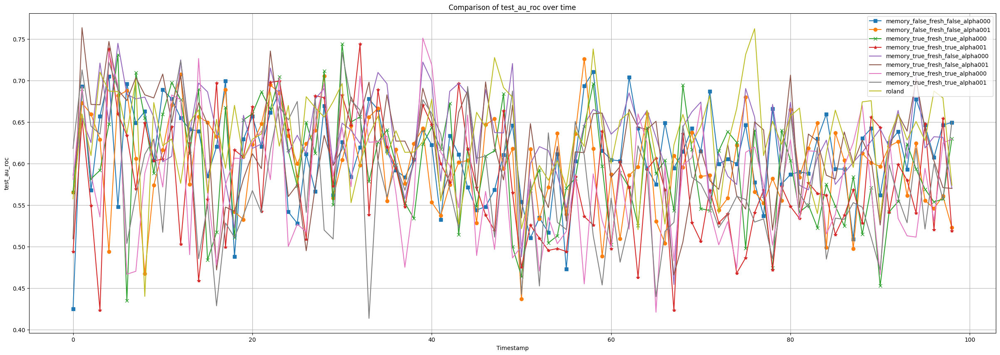

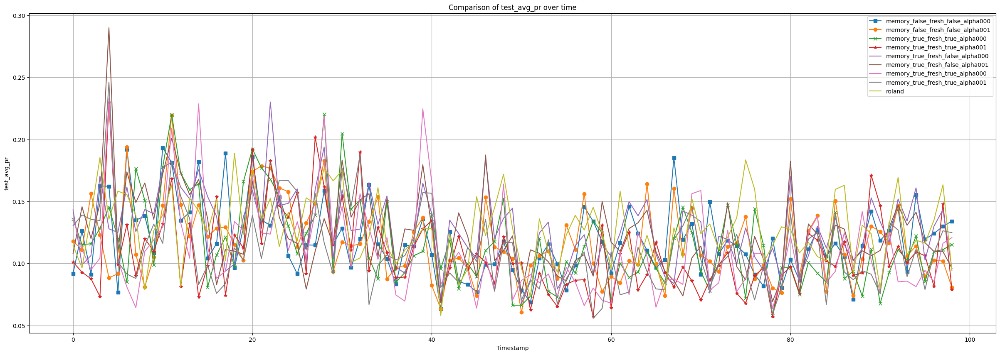

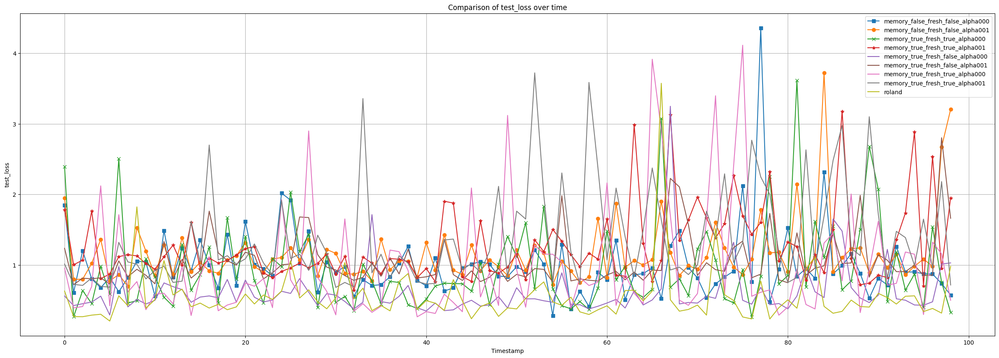

memory_false_fresh_false_alpha000:
snapshots:99, avg_aucpr:0.11856964366002513, avg_au_roc:0.611629557428938
avg_allocated_MB:76.56883956446792, gpu_memory_reserved_MB:171.69107733832465
--------------------
memory_false_fresh_false_alpha001:
snapshots:99, avg_aucpr:0.11678546907925845, avg_au_roc:0.600409103162361
avg_allocated_MB:76.5688344782049, gpu_memory_reserved_MB:171.69107733832465
--------------------
memory_false_fresh_true_alpha000:
snapshots:99, avg_aucpr:0.11575146783331425, avg_au_roc:0.5961115495725111
avg_allocated_MB:76.56883440114031, gpu_memory_reserved_MB:171.69107733832465
--------------------
memory_false_fresh_true_alpha001:
snapshots:99, avg_aucpr:0.10824692448732826, avg_au_roc:0.5783255792627431
avg_allocated_MB:76.56883440114031, gpu_memory_reserved_MB:171.69107733832465
--------------------
memory_true_fresh_false_alpha000:
snapshots:99, avg_aucpr:0.1280937346093582, avg_au_roc:0.6343065819354973
avg_allocated_MB:114.77505046189434, gpu_memory_reserved_MB:2

In [63]:
memory_false_fresh_false_alph000_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GCN_FFalse/2025-04-24_18:42:35"
memory_false_fresh_false_alph001_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GCN_FFalse/2025-04-24_13:42:54"
memory_false_fresh_true_alph000_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GCN_FTrue/2025-04-24_19:52:20"
memory_false_fresh_true_alph001_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GCN_FTrue/2025-04-24_14:58:24"
memory_true_fresh_false_alph000_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemTrue_GCN_FFalse/2025-04-24_19:16:20"
memory_true_fresh_false_alph001_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemTrue_GCN_FFalse/2025-04-24_14:17:47"
memory_true_fresh_true_alph000_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemTrue_GCN_FTrue/2025-04-24_20:26:36"
memory_true_fresh_true_alph001_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemTrue_GCN_FTrue/2025-04-24_15:36:31"
roland_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/roland/edge_level/RedditBody/week/GCN_gru_128_128/2025-04-24_00:24:15"
df_model_memory_false_fresh_false_alpha000 = load_metrics(memory_false_fresh_false_alph000_path).sort_values("timestamp")
df_model_memory_false_fresh_false_alpha001 = load_metrics(memory_false_fresh_false_alph001_path).sort_values("timestamp")
df_model_memory_false_fresh_true_alpha000 = load_metrics(memory_false_fresh_true_alph000_path).sort_values("timestamp")
df_model_memory_false_fresh_true_alpha001 = load_metrics(memory_false_fresh_true_alph001_path).sort_values("timestamp")
df_model_memory_true_fresh_false_alpha000 = load_metrics(memory_true_fresh_false_alph000_path).sort_values("timestamp")
df_model_memory_true_fresh_false_alpha001 = load_metrics(memory_true_fresh_false_alph001_path).sort_values("timestamp")
df_model_memory_true_fresh_true_alpha000 = load_metrics(memory_true_fresh_true_alph000_path).sort_values("timestamp")
df_model_memory_true_fresh_true_alpha001 = load_metrics(memory_true_fresh_true_alph001_path).sort_values("timestamp")
df_roland = load_metrics(roland_path).sort_values("timestamp")
# plt.figure(figsize=(22, 5))
for metric in ["test_au_roc", "test_avg_pr", "test_loss"]:
    plt.figure(figsize=(30, 10))
    plt.plot(df_model_memory_false_fresh_false_alpha000["timestamp"], df_model_memory_false_fresh_false_alpha000[metric],
             label="memory_false_fresh_false_alpha000", marker='s')
    plt.plot(df_model_memory_false_fresh_false_alpha001["timestamp"], df_model_memory_false_fresh_false_alpha001[metric],
             label="memory_false_fresh_false_alpha001", marker='o')
    plt.plot(df_model_memory_false_fresh_true_alpha000["timestamp"], df_model_memory_false_fresh_true_alpha000[metric],
             label="memory_true_fresh_true_alpha000", marker='x')
    plt.plot(df_model_memory_false_fresh_true_alpha001["timestamp"], df_model_memory_false_fresh_true_alpha001[metric],
             label="memory_true_fresh_true_alpha001", marker='*')
    plt.plot(df_model_memory_true_fresh_false_alpha000["timestamp"], df_model_memory_true_fresh_false_alpha000[metric],
             label="memory_true_fresh_false_alpha000")
    plt.plot(df_model_memory_true_fresh_false_alpha001["timestamp"], df_model_memory_true_fresh_false_alpha001[metric],
             label="memory_true_fresh_false_alpha001")
    plt.plot(df_model_memory_true_fresh_true_alpha000["timestamp"], df_model_memory_true_fresh_true_alpha000[metric],
             label="memory_true_fresh_true_alpha000")
    plt.plot(df_model_memory_true_fresh_true_alpha001["timestamp"], df_model_memory_true_fresh_true_alpha001[metric],
             label="memory_true_fresh_true_alpha001")
    plt.plot(df_roland["timestamp"], df_roland[metric],
             label="roland")
    plt.xlabel("Timestamp")
    plt.ylabel(metric)
    plt.title(f"Comparison of {metric} over time")
    plt.legend()
    plt.grid()
    plt.show()
print("memory_false_fresh_false_alpha000:")
avg_metric(df_model_memory_false_fresh_false_alpha000)
print("memory_false_fresh_false_alpha001:")
avg_metric(df_model_memory_false_fresh_false_alpha001)
print("memory_false_fresh_true_alpha000:")
avg_metric(df_model_memory_false_fresh_true_alpha000)
print("memory_false_fresh_true_alpha001:")
avg_metric(df_model_memory_false_fresh_true_alpha001)
print("memory_true_fresh_false_alpha000:")
avg_metric(df_model_memory_true_fresh_false_alpha000)
print("memory_true_fresh_false_alpha001:")
avg_metric(df_model_memory_true_fresh_false_alpha001)
print("memory_true_fresh_true_alpha000:")
avg_metric(df_model_memory_true_fresh_true_alpha000)
print("memory_true_fresh_true_alpha001:")
avg_metric(df_model_memory_true_fresh_true_alpha001)
print("Roland:")
avg_metric(df_roland)

## GIN

/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GIN_FFalse/2025-04-24_21:06:41/index_0/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GIN_FFalse/2025-04-24_21:06:41/index_1/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GIN_FFalse/2025-04-24_21:06:41/index_2/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GIN_FFalse/2025-04-24_21:06:41/index_3/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GIN_FFalse/2025-04-24_21:06:41/index_4/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GIN_FFalse/2025-04-24_21:06:41/index_5/l

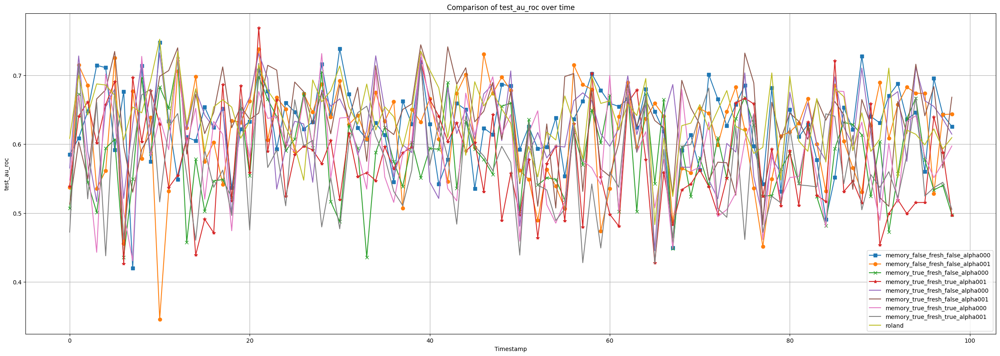

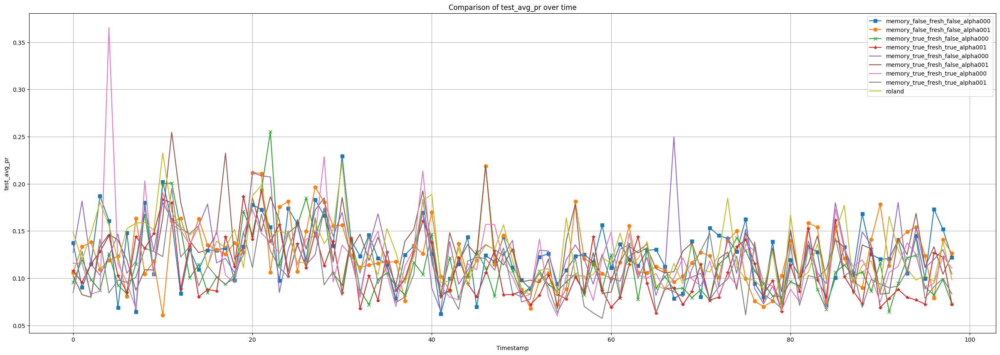

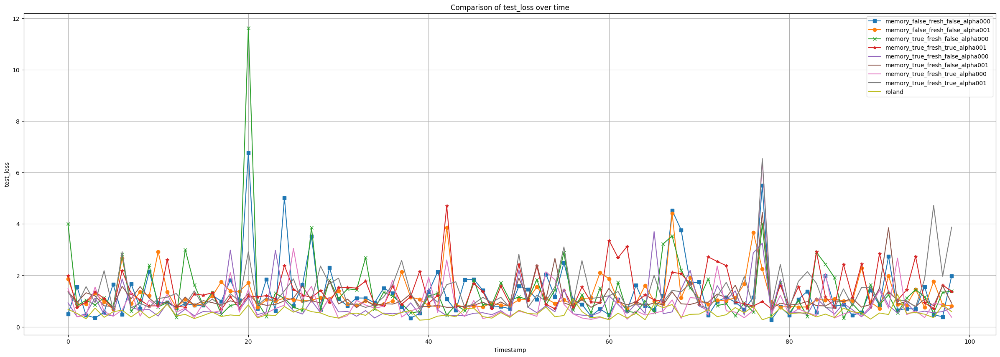

memory_false_fresh_false_alpha000:
snapshots:99, avg_aucpr:0.12597023688181477, avg_au_roc:0.629670933340535
avg_allocated_MB:76.19340954404889, gpu_memory_reserved_MB:150.42299860174006
--------------------
memory_false_fresh_false_alpha001:
snapshots:99, avg_aucpr:0.1251153225323768, avg_au_roc:0.6171189868690992
avg_allocated_MB:76.19339914032908, gpu_memory_reserved_MB:150.42299860174006
--------------------
memory_false_fresh_true_alpha000:
snapshots:99, avg_aucpr:0.11060823033554382, avg_au_roc:0.5830917542028908
avg_allocated_MB:76.19339906326448, gpu_memory_reserved_MB:150.42299860174006
--------------------
memory_false_fresh_true_alpha001:
snapshots:99, avg_aucpr:0.10768086169705243, avg_au_roc:0.5751358126149033
avg_allocated_MB:76.19338865954467, gpu_memory_reserved_MB:150.42299860174006
--------------------
memory_true_fresh_false_alpha000:
snapshots:99, avg_aucpr:0.12591009090344107, avg_au_roc:0.6233212237406258
avg_allocated_MB:114.40227277351148, gpu_memory_reserved_MB

In [65]:
memory_false_fresh_false_alph000_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GIN_FFalse/2025-04-24_21:06:41"
memory_false_fresh_false_alph001_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GIN_FFalse/2025-04-24_16:17:01"
memory_false_fresh_true_alph000_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GIN_FTrue/2025-04-24_22:14:56"
memory_false_fresh_true_alph001_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GIN_FTrue/2025-04-24_17:28:40"
memory_true_fresh_false_alph000_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemTrue_GIN_FFalse/2025-04-24_21:39:16"
memory_true_fresh_false_alph001_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemTrue_GIN_FFalse/2025-04-24_16:50:00"
memory_true_fresh_true_alph000_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemTrue_GIN_FTrue/2025-04-24_22:47:52"
memory_true_fresh_true_alph001_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemTrue_GIN_FTrue/2025-04-24_18:04:40"
roland_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/roland/edge_level/RedditBody/week/GIN_gru_128_128/2025-04-24_06:52:36"
df_model_memory_false_fresh_false_alpha000 = load_metrics(memory_false_fresh_false_alph000_path).sort_values("timestamp")
df_model_memory_false_fresh_false_alpha001 = load_metrics(memory_false_fresh_false_alph001_path).sort_values("timestamp")
df_model_memory_false_fresh_true_alpha000 = load_metrics(memory_false_fresh_true_alph000_path).sort_values("timestamp")
df_model_memory_false_fresh_true_alpha001 = load_metrics(memory_false_fresh_true_alph001_path).sort_values("timestamp")
df_model_memory_true_fresh_false_alpha000 = load_metrics(memory_true_fresh_false_alph000_path).sort_values("timestamp")
df_model_memory_true_fresh_false_alpha001 = load_metrics(memory_true_fresh_false_alph001_path).sort_values("timestamp")
df_model_memory_true_fresh_true_alpha000 = load_metrics(memory_true_fresh_true_alph000_path).sort_values("timestamp")
df_model_memory_true_fresh_true_alpha001 = load_metrics(memory_true_fresh_true_alph001_path).sort_values("timestamp")
df_roland = load_metrics(roland_path).sort_values("timestamp")
# plt.figure(figsize=(22, 5))
for metric in ["test_au_roc", "test_avg_pr", "test_loss"]:
    plt.figure(figsize=(30, 10))
    plt.plot(df_model_memory_false_fresh_false_alpha000["timestamp"], df_model_memory_false_fresh_false_alpha000[metric],
             label="memory_false_fresh_false_alpha000", marker='s')
    plt.plot(df_model_memory_false_fresh_false_alpha001["timestamp"], df_model_memory_false_fresh_false_alpha001[metric],
             label="memory_false_fresh_false_alpha001", marker='o')
    plt.plot(df_model_memory_false_fresh_true_alpha000["timestamp"], df_model_memory_false_fresh_true_alpha000[metric],
             label="memory_true_fresh_false_alpha000", marker='x')
    plt.plot(df_model_memory_false_fresh_true_alpha001["timestamp"], df_model_memory_false_fresh_true_alpha001[metric],
             label="memory_true_fresh_true_alpha001", marker='*')
    plt.plot(df_model_memory_true_fresh_false_alpha000["timestamp"], df_model_memory_true_fresh_false_alpha000[metric],
             label="memory_true_fresh_false_alpha000")
    plt.plot(df_model_memory_true_fresh_false_alpha001["timestamp"], df_model_memory_true_fresh_false_alpha001[metric],
             label="memory_true_fresh_false_alpha001")
    plt.plot(df_model_memory_true_fresh_true_alpha000["timestamp"], df_model_memory_true_fresh_true_alpha000[metric],
             label="memory_true_fresh_true_alpha000")
    plt.plot(df_model_memory_true_fresh_true_alpha001["timestamp"], df_model_memory_true_fresh_true_alpha001[metric],
             label="memory_true_fresh_true_alpha001")
    plt.plot(df_roland["timestamp"], df_roland[metric],
             label="roland")
    plt.xlabel("Timestamp")
    plt.ylabel(metric)
    plt.title(f"Comparison of {metric} over time")
    plt.legend()
    plt.grid()
    plt.show()
print("memory_false_fresh_false_alpha000:")
avg_metric(df_model_memory_false_fresh_false_alpha000)
print("memory_false_fresh_false_alpha001:")
avg_metric(df_model_memory_false_fresh_false_alpha001)
print("memory_false_fresh_true_alpha000:")
avg_metric(df_model_memory_false_fresh_true_alpha000)
print("memory_false_fresh_true_alpha001:")
avg_metric(df_model_memory_false_fresh_true_alpha001)
print("memory_true_fresh_false_alpha000:")
avg_metric(df_model_memory_true_fresh_false_alpha000)
print("memory_true_fresh_false_alpha001:")
avg_metric(df_model_memory_true_fresh_false_alpha001)
print("memory_true_fresh_true_alpha000:")
avg_metric(df_model_memory_true_fresh_true_alpha000)
print("memory_true_fresh_true_alpha001:")
avg_metric(df_model_memory_true_fresh_true_alpha001)
print("Roland:")
avg_metric(df_roland)

## Influence of different alpha and learning rates without mem and fresh_start


/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GIN_FFalse/2025-04-26_13:07:57/index_0/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GIN_FFalse/2025-04-26_13:07:57/index_1/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GIN_FFalse/2025-04-26_13:07:57/index_2/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GIN_FFalse/2025-04-26_13:07:57/index_3/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GIN_FFalse/2025-04-26_13:07:57/index_4/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GIN_FFalse/2025-04-26_13:07:57/index_5/l

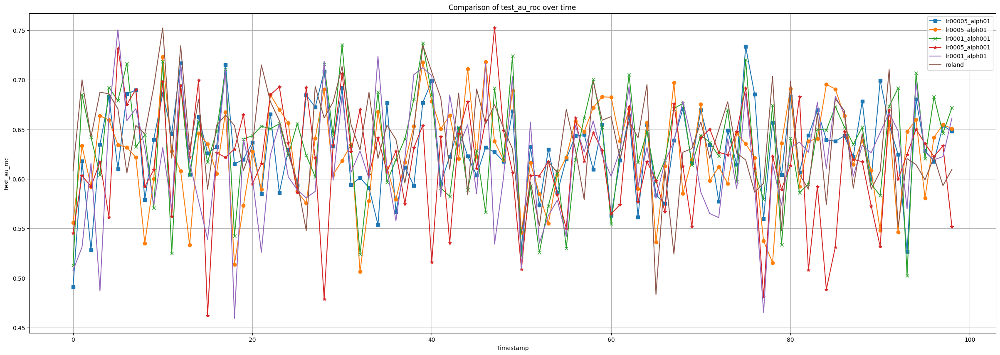

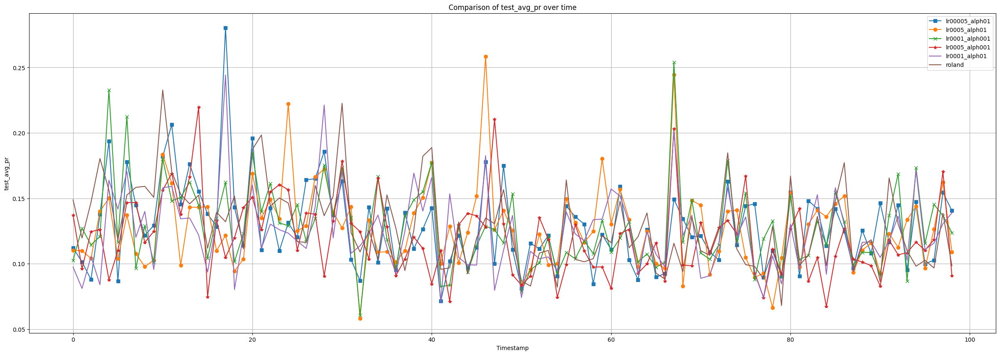

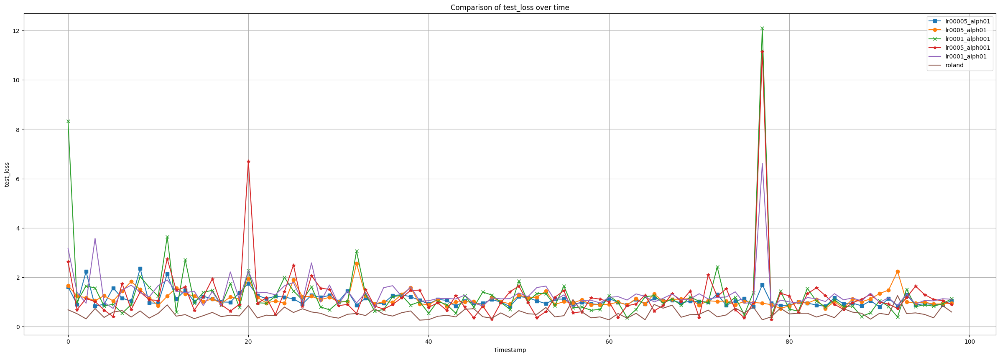

lr00005_alph01:
snapshots:99, avg_aucpr:0.1286867855474202, avg_au_roc:0.630189370025288
avg_allocated_MB:78.67349574541805, gpu_memory_reserved_MB:154.21481939758917
--------------------
lr0005_alph01:
snapshots:99, avg_aucpr:0.12728190388191826, avg_au_roc:0.6262126125470556
avg_allocated_MB:78.67349574541805, gpu_memory_reserved_MB:154.21481939758917
--------------------
lr0001_alph001:
snapshots:99, avg_aucpr:0.12806411825045186, avg_au_roc:0.6333926867957067
avg_allocated_MB:78.67349574541805, gpu_memory_reserved_MB:154.21481939758917
--------------------
lr0005_alph001:
snapshots:99, avg_aucpr:0.12016359408094422, avg_au_roc:0.6161133692120061
avg_allocated_MB:78.67349574541805, gpu_memory_reserved_MB:154.21481939758917
--------------------
lr0001_alph01:
snapshots:99, avg_aucpr:0.124269899771069, avg_au_roc:0.6200420814331131
avg_allocated_MB:78.67349574541805, gpu_memory_reserved_MB:154.21481939758917
--------------------
Roland:
snapshots:99, avg_aucpr:0.12889806294079978, avg

In [66]:
lr00005_alph01_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GIN_FFalse/2025-04-26_13:07:57"
lr0005_alph01_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GIN_FFalse/2025-04-26_12:10:24"
lr0001_alph001_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GIN_FFalse/2025-04-26_11:18:30"
lr0005_alph001_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GIN_FFalse/2025-04-26_10:21:59"
lr0001_alph01_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/edge_level/RedditBody/week/MemFalse_GIN_FFalse/2025-04-26_09:24:23"

roland_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/roland/edge_level/RedditBody/week/GIN_gru_128_128/2025-04-24_06:52:36"
df_model_lr00005_alph01 = load_metrics(lr00005_alph01_path).sort_values("timestamp")
df_model_lr0005_alph01 = load_metrics(lr0005_alph01_path).sort_values("timestamp")
df_model_lr0001_alph001 = load_metrics(lr0001_alph001_path).sort_values("timestamp")
df_model_lr0005_alph001 = load_metrics(lr0005_alph001_path).sort_values("timestamp")
df_model_lr0001_alph01 = load_metrics(lr0001_alph01_path).sort_values("timestamp")
df_roland = load_metrics(roland_path).sort_values("timestamp")
# plt.figure(figsize=(22, 5))
for metric in ["test_au_roc", "test_avg_pr", "test_loss"]:
    plt.figure(figsize=(30, 10))
    plt.plot(df_model_lr00005_alph01["timestamp"], df_model_lr00005_alph01[metric],
             label="lr00005_alph01", marker='s')
    plt.plot(df_model_lr0005_alph01["timestamp"], df_model_lr0005_alph01[metric],
             label="lr0005_alph01", marker='o')
    plt.plot(df_model_lr0001_alph001["timestamp"], df_model_lr0001_alph001[metric],
             label="lr0001_alph001", marker='x')
    plt.plot(df_model_lr0005_alph001["timestamp"], df_model_lr0005_alph001[metric],
             label="lr0005_alph001", marker='*')
    plt.plot(df_model_lr0001_alph01["timestamp"], df_model_lr0001_alph01[metric],
             label="lr0001_alph01")
    plt.plot(df_roland["timestamp"], df_roland[metric],
             label="roland")
    plt.xlabel("Timestamp")
    plt.ylabel(metric)
    plt.title(f"Comparison of {metric} over time")
    plt.legend()
    plt.grid()
    plt.show()
print("lr00005_alph01:")
avg_metric(df_model_lr00005_alph01)
print("lr0005_alph01:")
avg_metric(df_model_lr0005_alph01)
print("lr0001_alph001:")
avg_metric(df_model_lr0001_alph001)
print("lr0005_alph001:")
avg_metric(df_model_lr0005_alph001)
print("lr0001_alph01:")
avg_metric(df_model_lr0001_alph01)
print("Roland:")
avg_metric(df_roland)

# DGraphFin

## GIN embedding size 32

/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemFalse_GIN_FFalse/2025-05-07_15:52:17/index_0/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemFalse_GIN_FFalse/2025-05-07_15:52:17/index_1/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemFalse_GIN_FFalse/2025-05-07_15:52:17/index_2/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemFalse_GIN_FFalse/2025-05-07_15:52:17/index_3/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemFalse_GIN_FFalse/2025-05-07_15:52:17/index_4/lightning_logs/metrics.csv
/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemFalse_GIN_FFalse/2025-05-07_15:52:17/index_5/lightni

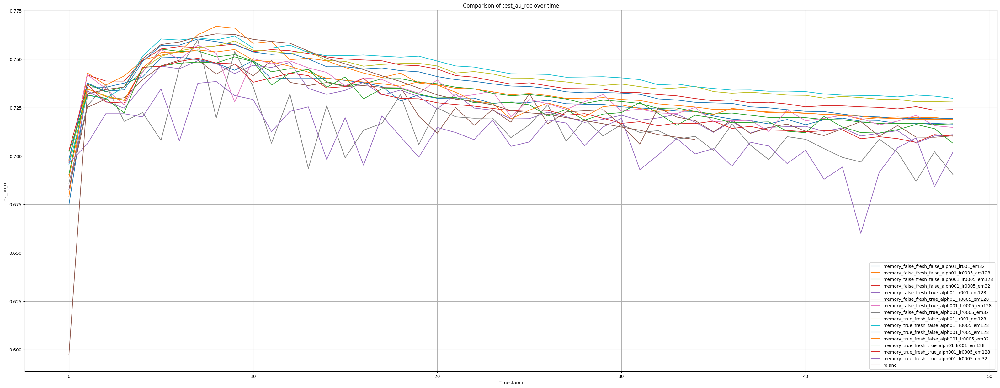

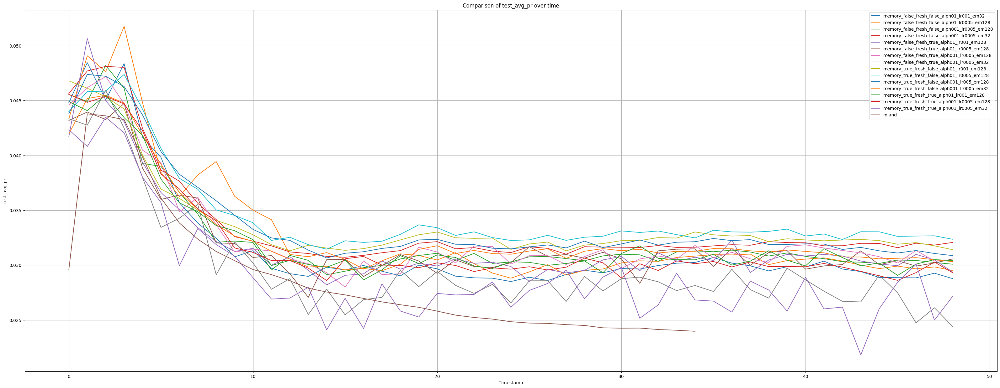

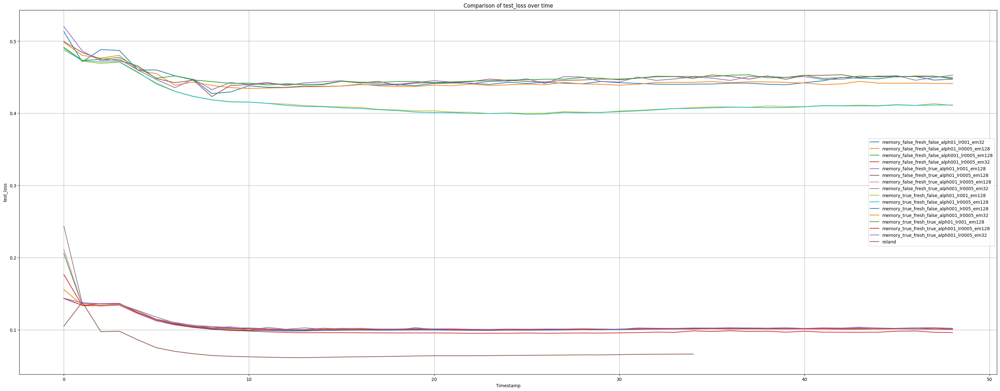

memory_false_fresh_false_alph01_lr001_em32:
snapshots:49, avg_aucpr:0.03167128064954763, avg_au_roc:0.7286323199466783
avg_allocated_MB:3776.408522002551, gpu_memory_reserved_MB:9748.375667649872
--------------------
memory_false_fresh_false_alph01_lr0005_em128:
snapshots:49, avg_aucpr:0.03292289030339032, avg_au_roc:0.7328717513960235
avg_allocated_MB:3776.408522002551, gpu_memory_reserved_MB:9748.375667649872
--------------------
memory_false_fresh_false_alph001_lr0005_em128:
snapshots:49, avg_aucpr:0.032479942035005975, avg_au_roc:0.73118529879317
avg_allocated_MB:3776.408522002551, gpu_memory_reserved_MB:9748.375667649872
--------------------
memory_false_fresh_false_alph001_lr0005_em32:
snapshots:49, avg_aucpr:0.033545899946166496, avg_au_roc:0.7379720016401641
avg_allocated_MB:2354.9854125976562, gpu_memory_reserved_MB:9747.904864875638
--------------------
memory_false_fresh_true_alph01_lr001_em128:
snapshots:49, avg_aucpr:0.03193361665673397, avg_au_roc:0.7246831570352826
avg_a

In [73]:
memory_false_fresh_false_alph01_lr001_em32_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemFalse_GIN_FFalse/2025-05-07_15:52:17"
memory_false_fresh_false_alph01_lr0005_em128_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemFalse_GIN_FFalse/2025-05-07_22:48:23"
memory_false_fresh_false_alph001_lr0005_em128_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemFalse_GIN_FFalse/2025-05-08_05:48:31"
memory_false_fresh_false_alph001_lr0005_em32_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemFalse_GIN_FFalse/2025-05-08_14:34:04"
##
memory_false_fresh_true_alph01_lr001_em128_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemFalse_GIN_FTrue/2025-05-07_19:19:49"
memory_false_fresh_true_alph01_lr0005_em128_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemFalse_GIN_FTrue/2025-05-08_02:18:27"
memory_false_fresh_true_alph001_lr0005_em128_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemFalse_GIN_FTrue/2025-05-08_09:16:34"
memory_false_fresh_true_alph001_lr0005_em32_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemFalse_GIN_FTrue/2025-05-08_16:48:07"
##
memory_true_fresh_false_alph01_lr001_em128_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemTrue_GIN_FFalse/2025-05-07_17:30:52"
memory_true_fresh_false_alph01_lr0005_em128_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemTrue_GIN_FFalse/2025-05-08_00:30:54"
memory_true_fresh_false_alph001_lr005_em128_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemTrue_GIN_FFalse/2025-05-08_07:28:27"
memory_true_fresh_false_alph001_lr0005_em32_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemTrue_GIN_FFalse/2025-05-08_15:42:50"
##
memory_true_fresh_true_alph01_lr001_em128_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemTrue_GIN_FTrue/2025-05-07_20:59:56"
memory_true_fresh_true_alph001_lr0005_em128_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemTrue_GIN_FTrue/2025-05-08_04:00:21"
memory_true_fresh_true_alph001_lr0005_em32_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemTrue_GIN_FTrue/2025-05-08_17:55:24"
roland_path = "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/roland/node_level/DGraphFin/week/GIN_gru_32_32/2025-05-03_13:42:26"

paths = {
    "memory_false_fresh_false_alph01_lr001_em32_path": "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemFalse_GIN_FFalse/2025-05-07_15:52:17",
    "memory_false_fresh_false_alph01_lr0005_em128_path": "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemFalse_GIN_FFalse/2025-05-07_22:48:23",
    "memory_false_fresh_false_alph001_lr0005_em128_path": "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemFalse_GIN_FFalse/2025-05-08_05:48:31",
    "memory_false_fresh_false_alph001_lr0005_em32_path": "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemFalse_GIN_FFalse/2025-05-08_14:34:04",
    "memory_false_fresh_true_alph01_lr001_em128_path": "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemFalse_GIN_FTrue/2025-05-07_19:19:49",
    "memory_false_fresh_true_alph01_lr0005_em128_path": "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemFalse_GIN_FTrue/2025-05-08_02:18:27",
    "memory_false_fresh_true_alph001_lr0005_em128_path": "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemFalse_GIN_FTrue/2025-05-08_09:16:34",
    "memory_false_fresh_true_alph001_lr0005_em32_path": "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemFalse_GIN_FTrue/2025-05-08_16:48:07",
    "memory_true_fresh_false_alph01_lr001_em128_path": "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemTrue_GIN_FFalse/2025-05-07_17:30:52",
    "memory_true_fresh_false_alph01_lr0005_em128_path": "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemTrue_GIN_FFalse/2025-05-08_00:30:54",
    "memory_true_fresh_false_alph001_lr005_em128_path": "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemTrue_GIN_FFalse/2025-05-08_07:28:27",
    "memory_true_fresh_false_alph001_lr0005_em32_path": "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemTrue_GIN_FFalse/2025-05-08_15:42:50",
    "memory_true_fresh_true_alph01_lr001_em128_path": "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemTrue_GIN_FTrue/2025-05-07_20:59:56",
    "memory_true_fresh_true_alph001_lr0005_em128_path": "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemTrue_GIN_FTrue/2025-05-08_04:00:21",
    "memory_true_fresh_true_alph001_lr0005_em32_path": "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/dyfraudnet/node_level/DGraphFin/week/MemTrue_GIN_FTrue/2025-05-08_17:55:24",
    "roland_path": "/home/vahid/Projects/pythonProject/DyFraudNet/experiments/roland/node_level/DGraphFin/week/GIN_gru_32_32/2025-05-03_13:42:26"
}
result_preview(paths)

